In [ ]:
import math
import json

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt

import folium
from folium import Map, Marker, CircleMarker
from folium.plugins import FloatImage

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from scipy.spatial.distance import euclidean, cosine
from scipy.stats import pearsonr

In [ ]:
import warnings
warnings.filterwarnings("ignore")

## Histograma Tipologias

In [ ]:
def extractTipologia(sheets, tipo):
  # Lista de tipologias
  tipologias = ['12', '35', '610', '1120', '2150', '51100', '101200', '201500', '5011000', '1001', '0']

  # Criar um DataFrame para armazenar os resultados
  resultados = []
  # Iterar sobre as planilhas das tipologias
  for tipologia in tipologias:
      # Carregar as planilhas Total, NF e F
      df = sheets.parse(f"{tipologia} {tipo}").replace("X", -1)

      # Iterar sobre as linhas do DataFrame
      for idx, row in df.iterrows():
          municipio = row['Município']
          valor = row["Número de estabelecimentos agropecuários com bovinos (Unidades)"]

          # Salvar o maior valor encontrado e a tipologia correspondente
          resultados.append({"Município": municipio, f"Tipologia {tipo}": tipologia, f"Valor {tipo}": valor})

  # Converter resultados para um DataFrame
  df_resultados = pd.DataFrame(resultados)
  df_resultados.sort_values(by="Município", ascending=True, inplace=True)

  # Determinar a maior tipologia por município
  return df_resultados.loc[df_resultados.groupby("Município")[f"Valor {tipo}"].idxmax()]

In [ ]:
# Carregar o arquivo Excel
file_path = "base_de_dados.xlsx"
sheets = pd.ExcelFile(file_path)

df_total = extractTipologia(sheets, "Total")
df_total.reset_index(drop=True, inplace=True)
df_total.head()

,Município,Tipologia Total,Valor Total
0,Afonso Cunha (MA),610,12
1,Alcântara (MA),12,531
2,Aldeias Altas (MA),35,66
3,Altamira do Maranhão (MA),2150,84
4,Alto Alegre do Maranhão (MA),610,28


In [ ]:
df_NF = extractTipologia(sheets, "NF")
df_NF.reset_index(drop=True, inplace=True)
df_NF.head()

,Município,Tipologia NF,Valor NF
0,Afonso Cunha (MA),51100,1
1,Alcântara (MA),12,28
2,Aldeias Altas (MA),35,11
3,Altamira do Maranhão (MA),201500,16
4,Alto Alegre do Maranhão (MA),51100,6


In [ ]:
df_F = extractTipologia(sheets, "F")
df_F.reset_index(drop=True, inplace=True)
df_F.head()

,Município,Tipologia F,Valor F
0,Afonso Cunha (MA),610,11
1,Alcântara (MA),12,503
2,Aldeias Altas (MA),610,56
3,Altamira do Maranhão (MA),2150,73
4,Alto Alegre do Maranhão (MA),610,24


In [ ]:
def plot_histogram_by_tipologia(sheets, municipio, tipo_tipologia):
    """
    Gera um histograma da coluna 'Número de estabelecimentos agropecuários com bovinos (Unidades)'
    para um município específico e tipo de tipologia.

    Parâmetros:
    - df (DataFrame): Tabela com os dados.
    - municipio (str): Nome do município.
    - tipo_tipologia (str): Tipo de tipologia ('Total', 'NF', 'F').

    Retorna:
    - Histograma plotado.
    """
    tipologias = ['12', '35', '610', '1120', '2150', '51100', '101200', '201500', '5011000', '1001', '0']

    # Criar um DataFrame para armazenar os resultados
    dados = []
    # Iterar sobre as planilhas das tipologias
    for tipologia in tipologias:
      # Carregar as planilhas Total, NF e F
      df = sheets.parse(f"{tipologia} {tipo_tipologia}").replace("X", -1)

      # Filtrar os dados pelo município e tipo de tipologia
      filtered_df = df[df['Município'] == municipio]

      # Obter os dados da coluna de interesse
      column_data = filtered_df["Número de estabelecimentos agropecuários com bovinos (Unidades)"].values
      dados.append(column_data)

    resultados = [x[0] for x in dados]

    # Criar o histograma
    plt.figure(figsize=(10, 6))
    plt.bar(tipologias, resultados, color='skyblue', edgecolor='black')
    plt.title(f"Histograma - {municipio} ({tipo_tipologia})", fontsize=14)
    plt.xlabel("Número de estabelecimentos agropecuários", fontsize=12)
    plt.ylabel("Frequência", fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

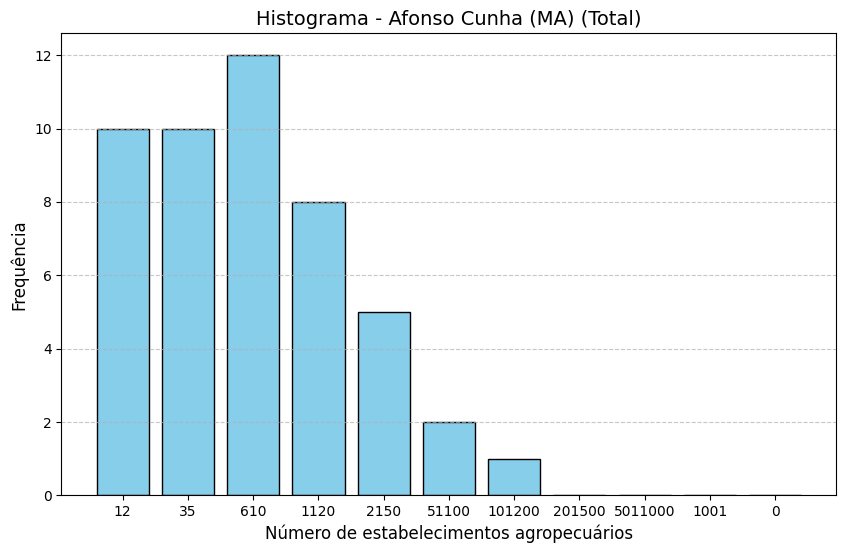

In [ ]:
plot_histogram_by_tipologia(sheets, "Afonso Cunha (MA)", "Total")

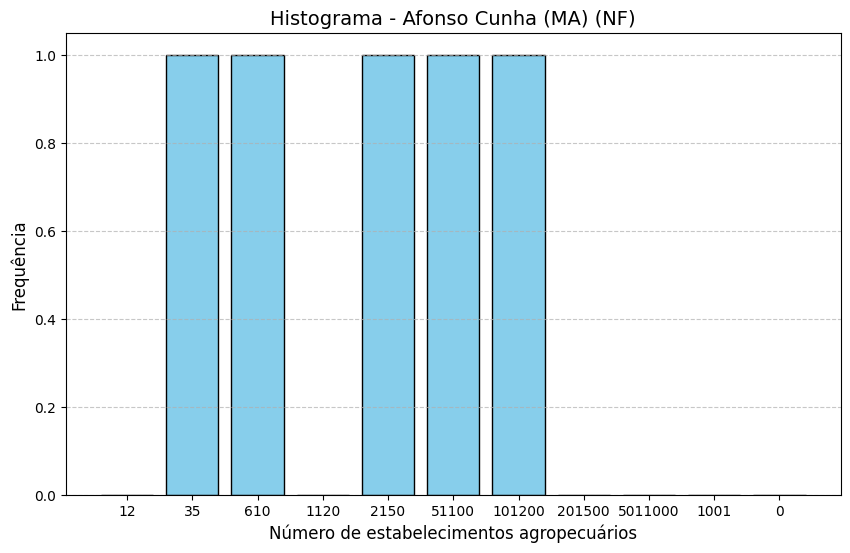

In [ ]:
plot_histogram_by_tipologia(sheets, "Afonso Cunha (MA)", "NF")

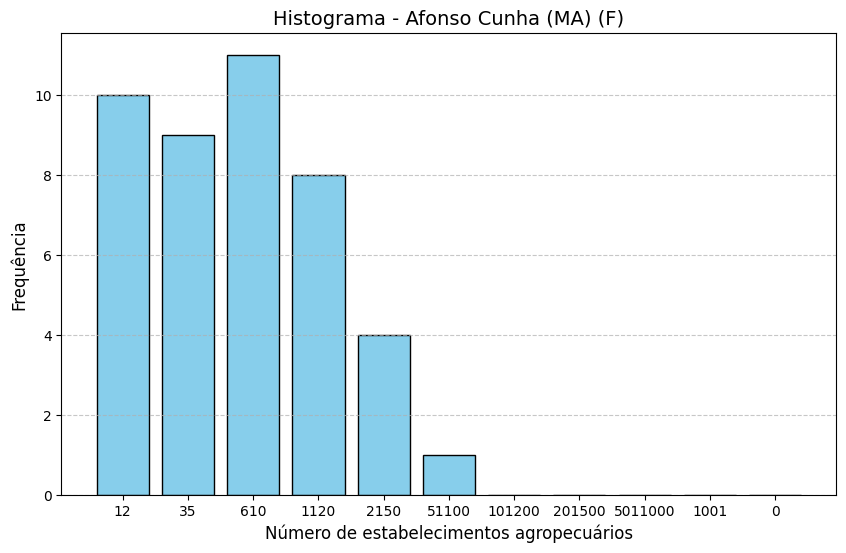

In [ ]:
plot_histogram_by_tipologia(sheets, "Afonso Cunha (MA)", "F")

## Distância Euclidiana - Total Estabelecimentos e Estabelecimentos Familiares

In [ ]:
# 2. Substituir valores 'X' por 0 e garantir que os dados sejam numéricos
def tratar_dados(df):
    df = df.replace("X", 0)  # Substituir 'X' por 0
    df.iloc[:, 1:] = df.iloc[:, 1:].apply(pd.to_numeric, errors='coerce').fillna(0)  # Garantir que sejam numéricos
    return df


In [ ]:
tipologias = ['12', '35', '610', '1120', '2150', '51100', '101200', '201500', '5011000', '1001', '0']

# Criar um DataFrame para armazenar os resultados
dados = pd.DataFrame()
df_total = sheets.parse("Total")
df_total = tratar_dados(df_total)
dados["Minicípio"] = df_total["Município"]
# Iterar sobre as planilhas das tipologias
for tipologia in tipologias:
  # Carregar as planilhas Total, NF e F
  df = sheets.parse(f"{tipologia} Total")
  # Obter os dados da coluna de interesse
  column_data = df["Número de estabelecimentos agropecuários com bovinos (Unidades)"]
  dados[f"{tipologia}"] = column_data

total_estabelecimentos = dados

In [ ]:
tipologias = ['12', '35', '610', '1120', '2150', '51100', '101200', '201500', '5011000', '1001', '0']

# Criar um DataFrame para armazenar os resultados
dados = pd.DataFrame()
df_total = sheets.parse("Total")
df_total = tratar_dados(df_total)
dados["Minicípio"] = df_total["Município"]
# Iterar sobre as planilhas das tipologias
for tipologia in tipologias:
  # Carregar as planilhas Total, NF e F
  df = sheets.parse(f"{tipologia} F")
  # Obter os dados da coluna de interesse
  column_data = df["Número de estabelecimentos agropecuários com bovinos (Unidades)"]
  dados[f"{tipologia}"] = column_data

familiar_estabelecimentos = dados

In [ ]:
def maiores_contribuicoes(vetor_geral, vetor_familiar):
    # Calcular as diferenças ao quadrado e o total
    diferencas_quadradas = [(i, (g - f) ** 2) for i, (g, f) in enumerate(zip(vetor_geral, vetor_familiar))]
    soma_total = sum([dif[1] for dif in diferencas_quadradas])

    # Se a soma total for zero, evitar divisão por zero
    if soma_total == 0:
        return {indice: 0.0 for indice, _ in diferencas_quadradas[:10]}

    # Calcular a porcentagem de contribuição
    maiores_com_percentual = {indice: round((valor / soma_total) * 100, 2) for indice, valor in diferencas_quadradas}
    return maiores_com_percentual

In [ ]:
# 4. Criar vetores para cada município
resultados = []

for i, municipio in enumerate(total_estabelecimentos.iloc[:, 0]):  # Iterar pelos municípios
    vetor_total = total_estabelecimentos.iloc[i, 1:].values  # Vetor da planilha 'Total'
    vetor_total_f = familiar_estabelecimentos.iloc[i, 1:].values  # Vetor da planilha 'Total F'

    # Cálculos das métricas
    distancia_euclidiana = euclidean(vetor_total, vetor_total_f)
    # similaridade_coseno = calcular_similaridade_coseno(vetor_total, vetor_total_f)
    similaridade_coseno = 1 - cosine(vetor_total, vetor_total_f) if not np.all(vetor_total == 0) else 0
    correlacao_pearson = pearsonr(vetor_total, vetor_total_f)[0] if len(set(vetor_total)) > 1 else 0


    # Salvar resultados
    resultados.append({
        "Cidade": municipio,
        "Distância Euclidiana": round(distancia_euclidiana, 2),
        "Similaridade Coseno": round(similaridade_coseno, 2),
        "Correlação Pearson": round(correlacao_pearson, 2)
    })

# 5. Criar um DataFrame com os resultados
df_resultados = pd.DataFrame(resultados)

df_contribuicoes = pd.DataFrame()
# Criar a nova coluna com os índices e suas contribuições percentuais
for i, municipio in enumerate(total_estabelecimentos.iloc[:, 0]):
  total = total_estabelecimentos.iloc[i, 1:].values
  familiar = familiar_estabelecimentos.iloc[i, 1:].values
  df_contribuicoes[f"{municipio}"] = maiores_contribuicoes(total, familiar)


In [ ]:
df_resultados.sort_values(by="Distância Euclidiana", ascending=False, inplace=True)
df_resultados.reset_index(drop=True, inplace=True)
df_resultados

,Cidade,Distância Euclidiana,Similaridade Coseno,Correlação Pearson
0,Grajaú (MA),204.98,1.00,1.00
1,Açailândia (MA),142.80,0.96,0.94
2,Amarante do Maranhão (MA),119.59,1.00,1.00
3,Matinha (MA),118.10,1.00,1.00
4,Riachão (MA),117.10,0.99,0.99
...,...,...,...,...
212,Presidente Juscelino (MA),2.83,1.00,1.00
213,Afonso Cunha (MA),2.24,1.00,0.99
214,Belágua (MA),2.24,1.00,1.00
215,Duque Bacelar (MA),1.73,1.00,1.00


In [ ]:
df_contribuicoes = df_contribuicoes.transpose()
df_contribuicoes.columns = tipologias
df_contribuicoes

,12,35,610,1120,2150,51100,101200,201500,5011000,1001,0
Açailândia (MA),0.00,0.04,0.12,0.83,7.85,5.34,18.25,46.14,7.08,14.30,0.04
Afonso Cunha (MA),0.00,20.00,20.00,0.00,20.00,20.00,20.00,0.00,0.00,0.00,0.00
Água Doce do Maranhão (MA),13.79,42.24,42.24,0.86,0.86,0.00,0.00,0.00,0.00,0.00,0.00
Alcântara (MA),84.12,12.98,0.97,0.00,0.11,0.11,0.00,0.00,0.00,0.00,1.72
Aldeias Altas (MA),13.69,33.80,10.06,13.69,27.93,0.28,0.28,0.00,0.28,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
Viana (MA),0.31,4.94,25.02,19.77,37.37,2.78,7.72,1.93,0.00,0.08,0.08
Vila Nova dos Martírios (MA),0.16,0.00,0.04,1.46,7.97,4.92,11.75,61.85,4.92,6.87,0.04
Vitória do Mearim (MA),5.98,13.46,7.24,21.60,28.96,17.30,4.85,0.54,0.06,0.00,0.00
Vitorino Freire (MA),0.10,0.75,6.71,11.93,35.23,15.09,17.71,8.49,1.97,1.97,0.05


In [ ]:
principais_municipios = df_resultados["Cidade"][:25]
df_filtrado = df_contribuicoes.loc[principais_municipios]

In [ ]:
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

df_resultados['Cidade'] = df_resultados['Cidade'].str.replace(" (MA)", "", regex=False)

# Criar o dicionário de proporções
distancia_dict = pd.Series(df_resultados['Distância Euclidiana'].values.astype('str'), index=df_resultados['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['distancia'] = distancia_dict.get(f"{municipio}", 'N/A') # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Criar a camada Choropleth
choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_resultados,
    columns=["Cidade", "Distância Euclidiana"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Distância euclidiana',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "distancia"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Distância euclidiana: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m

In [ ]:
df_filtrado.describe()

,12,35,610,1120,2150,51100,101200,201500,5011000,1001,0
count,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.000000,25.00000,25.000000,25.000000
mean,0.917200,2.389200,8.004000,12.634000,28.476800,12.275600,14.159200,17.250400,2.41280,1.421200,0.058000
std,3.045492,5.711655,8.903363,8.057165,13.002066,7.536345,7.931187,12.358698,2.77196,3.014636,0.100499
min,0.000000,0.020000,0.120000,0.830000,4.050000,0.580000,0.260000,0.060000,0.00000,0.000000,0.000000
25%,0.020000,0.390000,2.370000,6.990000,20.140000,5.800000,9.490000,7.340000,0.54000,0.100000,0.000000
50%,0.080000,0.780000,5.400000,11.900000,30.830000,13.540000,14.160000,14.860000,1.14000,0.280000,0.010000
75%,0.360000,1.070000,8.610000,16.000000,35.780000,17.440000,17.710000,26.630000,3.23000,0.990000,0.050000
max,15.070000,28.290000,33.150000,38.210000,55.290000,32.000000,30.790000,46.140000,10.63000,14.300000,0.380000


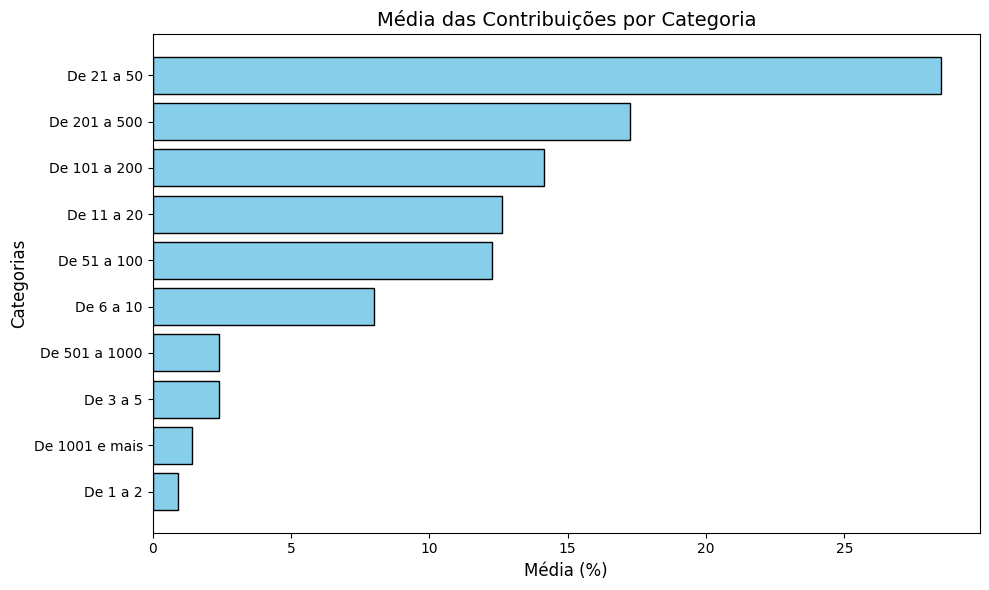

In [ ]:
# Dados das médias das categorias
medias = {
    0: 0.917200,
    1: 2.389200,
    2: 8.004000,
    3: 12.634000,
    4: 28.476800,
    5: 12.275600,
    6: 14.159200,
    7: 17.250400,
    8: 2.41280,
    9: 1.421200
}

# Nomes correspondentes às categorias
nomes_categorias = {
    0: "De 1 a 2",
    1: "De 3 a 5",
    2: "De 6 a 10",
    3: "De 11 a 20",
    4: "De 21 a 50",
    5: "De 51 a 100",
    6: "De 101 a 200",
    7: "De 201 a 500",
    8: "De 501 a 1000",
    9: "De 1001 e mais"
}

# Ordenar as categorias pela média (maior para menor)
categorias_ordenadas = sorted(medias.items(), key=lambda x: x[1], reverse=True)

# Extrair os dados para o gráfico
categorias = [nomes_categorias[cat[0]] for cat in categorias_ordenadas]
valores = [cat[1] for cat in categorias_ordenadas]

# Criar o gráfico de barras horizontais
plt.figure(figsize=(10, 6))
plt.barh(categorias, valores, color='skyblue', edgecolor='black')

# Configurar títulos e rótulos
plt.title('Média das Contribuições por Categoria', fontsize=14)
plt.xlabel('Média (%)', fontsize=12)
plt.ylabel('Categorias', fontsize=12)
plt.gca().invert_yaxis()  # Inverter o eixo Y para exibir a maior média no topo

# Exibir o gráfico
plt.tight_layout()
plt.show()


In [ ]:
def calcular_proporcoes(maiores_contribuicoes):
    soma_total = sum(maiores_contribuicoes.values)
    proporcoes = {categoria: round((valor / soma_total) * 100, 2) for categoria, valor in maiores_contribuicoes.items()} if soma_total > 0 else {}
    return proporcoes

df_proporcoes = pd.DataFrame()
# Criar a nova coluna com os índices e suas contribuições percentuais
for i, municipio in enumerate(total_estabelecimentos.iloc[:, 0]):
  total = df_contribuicoes.loc[municipio]
  df_proporcoes[f"{municipio}"] = calcular_proporcoes(total)


In [ ]:
df_proporcoes = df_proporcoes.transpose()

In [ ]:
df_proporcoes

,12,35,610,1120,2150,51100,101200,201500,5011000,1001,0
Açailândia (MA),0.00,0.04,0.12,0.83,7.85,5.34,18.25,46.14,7.08,14.30,0.04
Afonso Cunha (MA),0.00,20.00,20.00,0.00,20.00,20.00,20.00,0.00,0.00,0.00,0.00
Água Doce do Maranhão (MA),13.79,42.24,42.24,0.86,0.86,0.00,0.00,0.00,0.00,0.00,0.00
Alcântara (MA),84.11,12.98,0.97,0.00,0.11,0.11,0.00,0.00,0.00,0.00,1.72
Aldeias Altas (MA),13.69,33.80,10.06,13.69,27.93,0.28,0.28,0.00,0.28,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...
Viana (MA),0.31,4.94,25.02,19.77,37.37,2.78,7.72,1.93,0.00,0.08,0.08
Vila Nova dos Martírios (MA),0.16,0.00,0.04,1.46,7.97,4.92,11.75,61.86,4.92,6.87,0.04
Vitória do Mearim (MA),5.98,13.46,7.24,21.60,28.96,17.30,4.85,0.54,0.06,0.00,0.00
Vitorino Freire (MA),0.10,0.75,6.71,11.93,35.23,15.09,17.71,8.49,1.97,1.97,0.05


In [ ]:
df_proporcoes['Categoria Dominante'] = df_proporcoes.idxmax(axis=1)

In [ ]:
def calcular_proporcoes_familiares_todas_cidades(df_total, df_familiar):
    # Lista para armazenar os dados de todas as cidades
    proporcoes_dados = []

    for i, municipio in enumerate(df_total.iloc[:, 0]):
      valores_total = df_total.iloc[i, 1:].values
      valores_familiar = df_familiar.iloc[i, 1:].values
      porcao_familiar = (valores_familiar / valores_total) * 100

      proporcoes_dict = {'Cidade': municipio}
      for i, label in enumerate(tipologias):
          proporcoes_dict[label] = porcao_familiar[i]

      proporcoes_dados.append(proporcoes_dict)

    porcao_familiar = pd.DataFrame(proporcoes_dados)
    return porcao_familiar



In [ ]:
# Exemplo de uso
# Substitua `df_estabelecimentos` pelo seu DataFrame e `lista_cidades` pela lista de cidades desejada
porcao_familiar = calcular_proporcoes_familiares_todas_cidades(total_estabelecimentos, familiar_estabelecimentos)

porcao_familiar = porcao_familiar.fillna(0).mean(numeric_only=True).round(2).rename("Agricultura familiar")
porcao_familiar = porcao_familiar.apply(lambda x: f"{x:.2f}%")

# Exibe o DataFrame
porcao_familiar

,Agricultura familiar
12,82.16%
35,87.84%
610,87.35%
1120,85.28%
2150,81.78%
51100,66.06%
101200,42.97%
201500,14.17%
5011000,1.55%
1001,0.09%


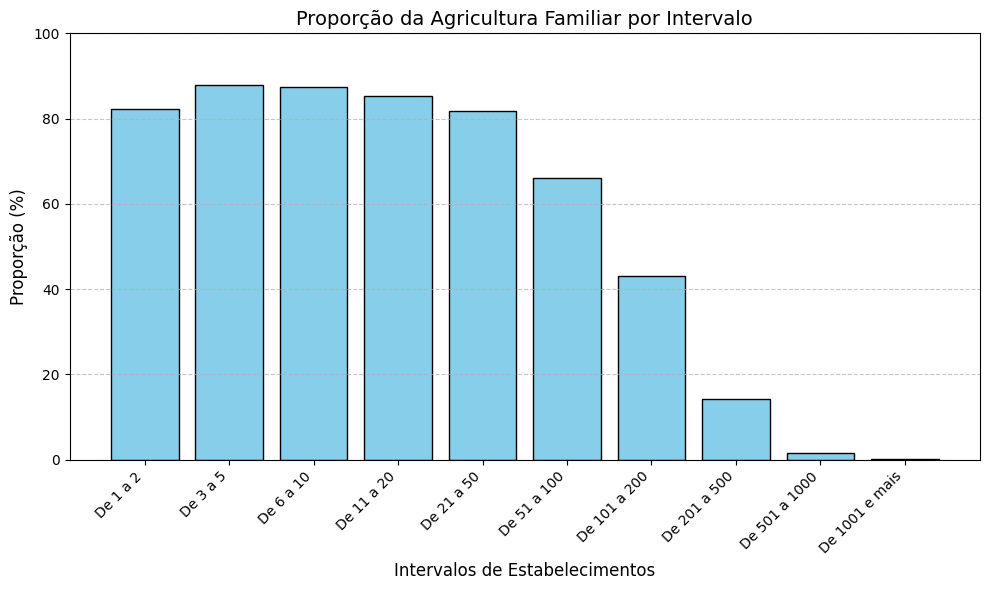

In [ ]:
intervalos = [
    "De 1 a 2", "De 3 a 5", "De 6 a 10", "De 11 a 20",
    "De 21 a 50", "De 51 a 100", "De 101 a 200",
    "De 201 a 500", "De 501 a 1000", "De 1001 e mais"
]

valores = [82.16, 87.84, 87.35, 85.28, 81.78, 66.06, 42.97, 14.17, 1.55, 0.09]

# Criar o histograma
plt.figure(figsize=(10, 6))
plt.bar(intervalos, valores, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right')
plt.title('Proporção da Agricultura Familiar por Intervalo', fontsize=14)
plt.xlabel('Intervalos de Estabelecimentos', fontsize=12)
plt.ylabel('Proporção (%)', fontsize=12)
plt.ylim(0, 100)  # Proporção varia de 0 a 100%
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibir o histograma
plt.tight_layout()
plt.show()

## Clusterização

In [ ]:
# 1. Carregar as planilhas
total_df = pd.read_excel(sheets, sheet_name="Total")
total_f_df = pd.read_excel(sheets, sheet_name="Total F")

total_df = tratar_dados(total_df)
total_f_df = tratar_dados(total_f_df)

#----------------------------------------------------------------#

# Excluindo a coluna 'Município' para análise PCA
total_values = total_df.drop(columns=['Município']).values
total_f_values = total_f_df.drop(columns=['Município']).values

# Padronizar os dados (o PCA funciona melhor se os dados estiverem normalizados)
scaler = StandardScaler()
total_scaled = scaler.fit_transform(total_values)

## Aplicar o PCA
n_components = 5
pca = PCA(n_components=n_components)  # Usando 2 componentes principais (primeiro e segundo)
pca.fit(total_scaled)

# A variância explicada por cada componente
variancia_explicada = pca.explained_variance_ratio_

# A contribuição de cada variável para os componentes principais
componentes = pca.components_

# Exibindo as contribuições das variáveis para o primeiro componente principal
# As contribuições de cada variável para o primeiro componente principal
contribuicoes_primeiro_componente = componentes[0]

# Identificar as 3 variáveis com as maiores contribuições para o primeiro componente

# Ordenar as variáveis pela magnitude das contribuições (absoluta)
importancia = np.abs(contribuicoes_primeiro_componente)
indices_importantes = np.argsort(importancia)[::-1]  # Ordenar em ordem decrescente

# As n variáveis mais importantes
n = 19
top_variaveis = ['Município'] + total_df.columns[indices_importantes[:n]+1].tolist() # Adicionando 1 para ignorar a coluna 'Município'
print(f"Top {n} variáveis mais importantes:", top_variaveis)

#----------------------------------------------------------------#

df_reduzido_total = total_df[top_variaveis]
df_reduzido_familiar = total_f_df[top_variaveis]

df_reduzido_total['Município'] = df_reduzido_total['Município'].str.replace(" (MA)", "", regex=False)
df_reduzido_familiar['Município'] = df_reduzido_familiar['Município'].str.replace(" (MA)", "", regex=False)


Top 19 variáveis mais importantes: ['Município', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Unidades)', 'Número de cabeças de vacas reprodutoras (2 anos e mais) nos estabelecimentos agropecuários (Cabeças)', 'Número de cabeças de bovinos nos estabelecimentos agropecuários (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)', 'Número de cabeças de bovinos nos estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)', 'Número de cabeças de bovinos para cria, recria ou engorda vendidas nos estabelecimentos agropecuários com mais de 50 cabeças (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)', 'Número de cabeças de bovinos vendi

### Total

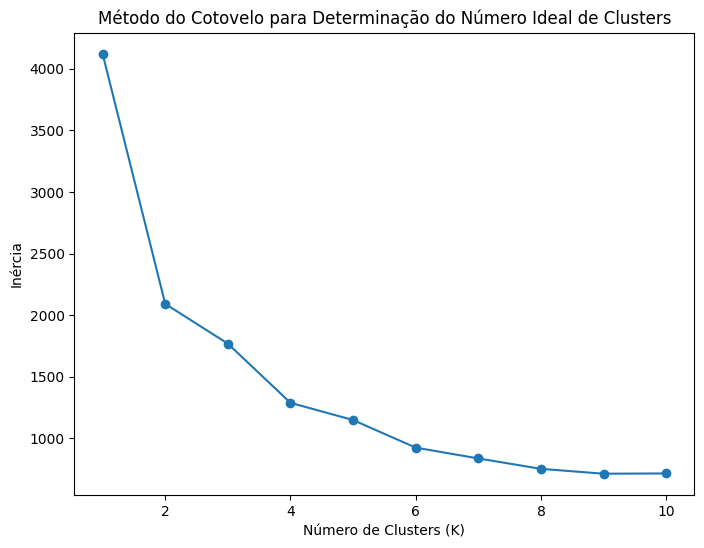

In [ ]:
# Normalizar os dados
scaler = StandardScaler()
df_reduzido_total_scaled = scaler.fit_transform(df_reduzido_total.drop(columns=['Município']))

# Calcular a inércia para diferentes valores de K
inercia = []
K_range = range(1, 11)  # Tente de 1 a 10 clusters, ajuste o intervalo conforme necessário
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_reduzido_total_scaled)
    inercia.append(kmeans.inertia_)

# Plotar o gráfico do cotovelo
plt.figure(figsize=(8, 6))
plt.plot(K_range, inercia, marker='o', linestyle='-')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Inércia')
plt.title('Método do Cotovelo para Determinação do Número Ideal de Clusters')
plt.show()


In [ ]:
# Aplicação do K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
df_reduzido_total['cluster'] = kmeans.fit_predict(df_reduzido_total_scaled)

cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4'}

colors = df_reduzido_total['cluster'].map(cluster_colors)

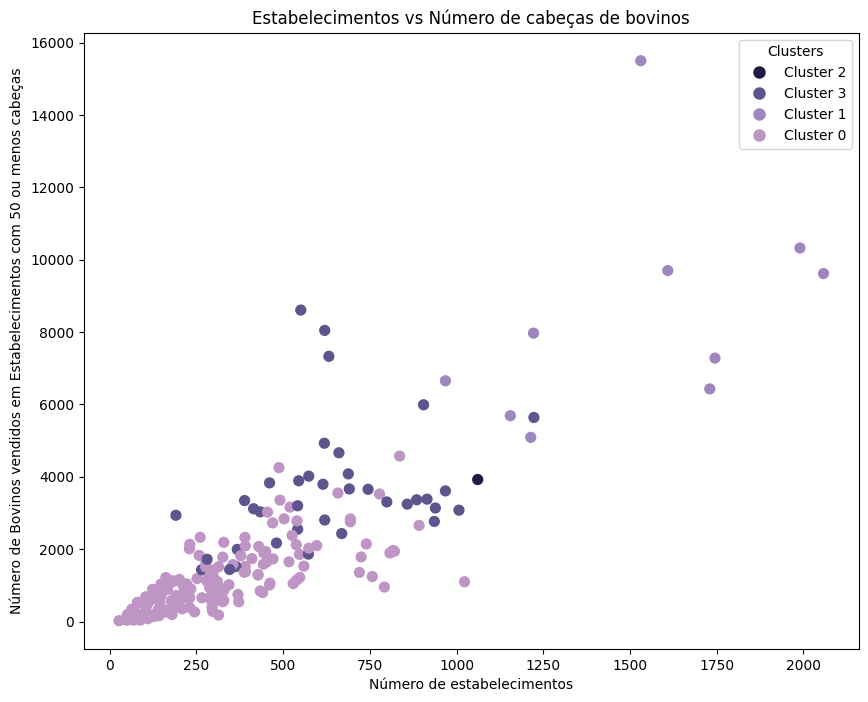

In [ ]:
# Estabelecimentos vs Leite produzido
plt.figure(figsize=(10, 8))
plt.scatter(df_reduzido_total['Número de estabelecimentos agropecuários com bovinos (Unidades)'],
            df_reduzido_total['Valor da venda de cabeças de bovinos nos estabelecimentos agropecuários com 50 cabeças e menos (Mil Reais)'],
            c=colors, s=50)
plt.xlabel('Número de estabelecimentos')
plt.ylabel('Número de Bovinos vendidos em Estabelecimentos com 50 ou menos cabeças')
plt.title('Estabelecimentos vs Número de cabeças de bovinos')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()

In [ ]:
# numeric_cols = df_reduzido_total.select_dtypes(include=['number']).columns
numeric_cols = total_df.columns[indices_importantes[:n]+1].tolist() # Adicionando 1 para ignorar a coluna 'Município'
cluster_summary = df_reduzido_total[numeric_cols].groupby(df_reduzido_total['cluster']).agg(['sum', 'mean'])

In [ ]:
cluster_summary[['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Unidades)', 'Número de cabeças de vacas reprodutoras (2 anos e mais) nos estabelecimentos agropecuários (Cabeças)', 'Número de cabeças de bovinos nos estabelecimentos agropecuários (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)', 'Número de cabeças de bovinos nos estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)', 'Número de cabeças de bovinos para cria, recria ou engorda vendidas nos estabelecimentos agropecuários com mais de 50 cabeças (Cabeças)', 'Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)', 'Número de cabeças de bovinos vendidas nos estabelecimentos agropecuários com 50 cabeças e menos (Cabeças)', 'Número de cabeças de bovinos nos estabelecimentos agropecuários com 50 cabeças e menos (Cabeças)']].round(2)

Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Unidades)  \
                                                                                          sum   
cluster                                                                                         
0                                                     6803                                      
1                                                     4110                                      
2                                                      615                                      
3                                                     7108                                      

                 \
           mean   
cluster           
0         40.25   
1        411.00   
2        615.00   
3        192.11   

        Número de cabeças de vacas reprodutoras (2 anos e mais) nos estabelecimentos agropecuários (Cabeças)  \
                                                                                                         sum   
cluster                                                                                                        
0                                                   696988                                                     
1                                                   416714                                                     
2                                                    58799                                                     
3                                                   683331                                                     

                   \
             mean   
cluster             
0         4124.19   
1        41671.40   
2        58799.00   
3        18468.41   

        Número de cabeças de bovinos nos estabelecimentos agropecuários (Cabeças)  \
                                                                              sum   
cluster                                                                             
0                                                  1963720                          
1                                                  1072154                          
2                                                   261982                          
3                                                  2121188                          

                    \
              mean   
cluster              
0         11619.64   
1        107215.40   
2        261982.00   
3         57329.41   

        Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)  \
                                                                                                                          sum   
cluster                                                                                                                         
0                                                     4298                                                                      
1                                                     2310                                                                      
2                                                      341                                                                      
3                                                     4561                                                                      

                 \
           mean   
cluster           
0         25.43   
1        231.00   
2        341.00   
3        123.27   

        Número de cabeças de bovinos nos estabelecimentos agropecuários com mais de 50 cabeças de bovinos (Cabeças)  \
                                                                                                                sum   
cluster                                                                                                               
0                                                  1303706                                                         

In [ ]:
cluster_summary[['Valor da venda de cabeças de bovinos para cria, recria ou engorda nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)', 'Valor da venda de cabeças de bovinos nos estabelecimentos agropecuários com 50 cabeças e menos (Mil Reais)', 'Número de estabelecimentos agropecuários com bovinos (Unidades)', 'Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)', 'Número de cabeças de matrizes e reprodutores de bovinos vendidas nos estabelecimentos agropecuários com mais de 50 cabeças (Cabeças)', 'Valor da venda de cabeças de matrizes e reprodutores de bovinos nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)', 'Número de cabeças de bovinos para abate vendidas nos estabelecimentos agropecuários com mais de 50 cabeças (Cabeças)', 'Valor da venda de cabeças de bovinos para abate nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)', 'Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos (Unidades)']].round(2
                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             )

Valor da venda de cabeças de bovinos para cria, recria ou engorda nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)  \
                                                                                                                                            sum   
cluster                                                                                                                                           
0                                                    81495                                                                                        
1                                                    82034                                                                                        
2                                                    20274                                                                                        
3                                                   141415                                                                                        

                   \
             mean   
cluster             
0          482.22   
1         8203.40   
2        20274.00   
3         3822.03   

        Valor da venda de cabeças de bovinos nos estabelecimentos agropecuários com 50 cabeças e menos (Mil Reais)  \
                                                                                                               sum   
cluster                                                                                                              
0                                                184297.90                                                           
1                                                 84240.77                                                           
2                                                  3924.05                                                           
3                                                133543.53                                                           

                  \
            mean   
cluster            
0        1090.52   
1        8424.08   
2        3924.05   
3        3609.28   

        Número de estabelecimentos agropecuários com bovinos (Unidades)  \
                                                                    sum   
cluster                                                                   
0                                                    51696                
1                                                    15222                
2                                                     1061                
3                                                    23317                

                  \
            mean   
cluster            
0         305.89   
1        1522.20   
2        1061.00   
3         630.19   

        Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)  \
                                                                                                               sum   
cluster                                                                                                              
0                                                    24467                                                           
1                                                     8065                                                           
2                                                      292                                                           
3                                                    11725                                                           

                 \
           mean   
cluster           
0        144.78   
1        806.50   
2        292.00   
3        316.89   

        Número de cabeças de matrizes e reprodutores de bovinos vendidas nos estabelecimentos agropecuários com mais de 50 cabeças (Cabeças)  \
                                                                                          

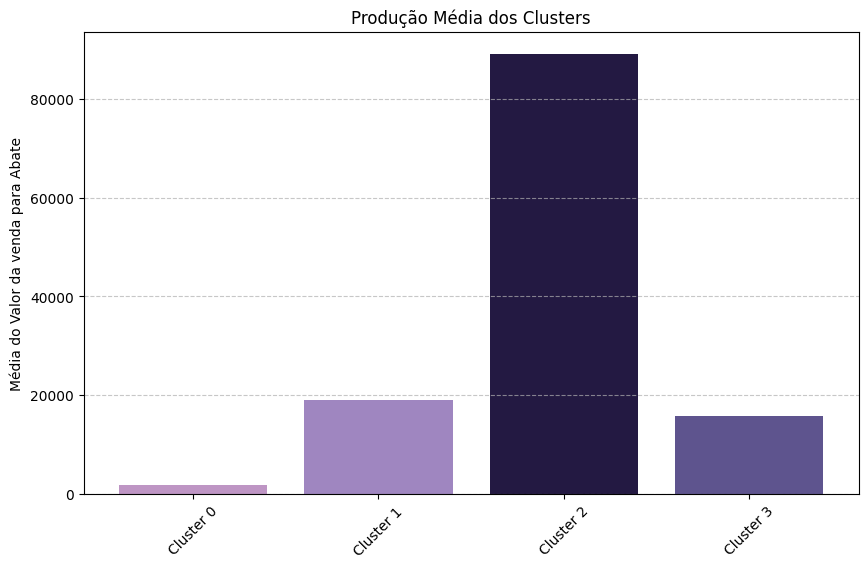

In [ ]:
clusters = ["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"]
c_colors = ['#be95c4', '#9f86c0', '#231942', '#5e548e']
plt.figure(figsize=(10, 6))
plt.bar(clusters, cluster_summary['Valor da venda de cabeças de bovinos para abate nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)']['mean'], color=c_colors)
plt.ylabel('Média do Valor da venda para Abate')
plt.title('Produção Média dos Clusters')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(clusters, rotation=45)
plt.show()


In [ ]:
# Carregar o arquivo geojson dos municípios
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

# Criar o dicionário de proporções
total_dict = pd.Series(df_reduzido_total['cluster'].values, index=df_reduzido_total['Município']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['cluster'] = total_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["cluster"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "cluster"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m.save('cluster_total.html')

### Mapa Total

In [ ]:
df_coords = pd.read_csv('latitude-longitude-cidades.csv', delimiter=';')

# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_destino = pd.read_excel('fluxos.xlsx', sheet_name='Destino da produção')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_destino = df_fluxos_destino[(df_fluxos_destino['UF_ORIGEM'] == 'MA') & (df_fluxos_destino['PRODUTO'] == 'Bovino e Bubalino corte')]

In [ ]:
# Renomear colunas para combinar com as de origem e destino
df_coords_origem = df_coords[['municipio', 'uf', 'latitude', 'longitude']].rename(
    columns={'municipio': 'NOME_ORIGEM', 'uf': 'UF_ORIGEM', 'latitude': 'latitude_ori', 'longitude': 'longitude_ori'}
)
df_coords_destino = df_coords[['municipio', 'uf', 'latitude', 'longitude']].rename(
    columns={'municipio': 'NOME_DESTINO', 'uf': 'UF_DESTINO', 'latitude': 'latitude_dest', 'longitude': 'longitude_dest'}
)

# Merge com as coordenadas de origem e destino
df_merged = pd.merge(df_fluxos_destino, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

### 50 Menos Vendas

In [ ]:


# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Criar o dicionário de proporções
total_dict_menos_50 = pd.Series(df_reduzido_total['Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)'].values, index=df_reduzido_total['Município']).to_dict()
total_dict_mais_50_mr = pd.Series(df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)'].values, index=df_reduzido_total['Município']).to_dict()
total_dict_mais_50_cre = pd.Series(df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)'].values, index=df_reduzido_total['Município']).to_dict()
total_dict_mais_50_abate = pd.Series(df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)'].values, index=df_reduzido_total['Município']).to_dict()

def get_style(feature):
    return {
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['venda_menos_50'] = total_dict_menos_50.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON
    feature['properties']['venda_mais_50_mr'] = total_dict_mais_50_mr.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON
    feature['properties']['venda_mais_50_cre'] = total_dict_mais_50_cre.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON
    feature['properties']['venda_mais_50_abate'] = total_dict_mais_50_abate.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)',
    highlight=True
).add_to(m)

folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "venda_menos_50"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com 50 cabeças e menos de bovinos com vendas: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa no Colab (para visualização imediata)
m

### 50 mais MR

In [ ]:
# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)',
    highlight=True
).add_to(m)

folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "venda_mais_50_mr"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com mais de 50 cabeças com vendas de Matrizes e Reprodutores: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)


# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:
# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)',
    highlight=True
).add_to(m)

folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "venda_mais_50_cre"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com mais de 50 cabeças com vendas pra Cria, Recria e Engorda: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)


# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:
# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)',
    highlight=True
).add_to(m)

folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "venda_mais_50_abate"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com mais de 50 cabeças com vendas para Abate: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)


# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:
df_reduzido_total['Estabelacimento Vendas Totais'] = df_reduzido_total['Número de estabelecimentos agropecuários com 50 cabeças e menos de bovinos que venderam bovinos (Unidades)'].values + df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam matrizes e reprodutores de bovinos (Unidades)'].values + df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para cria, recria ou engorda (Unidades)'].values + df_reduzido_total['Número de estabelecimentos agropecuários com mais de 50 cabeças de bovinos que venderam bovinos para abate (Unidades)'].values

In [ ]:
# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Estabelacimento Vendas Totais"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Estabelacimento Vendas Totais',
    highlight=True
).add_to(m)

folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "venda_menos_50", "venda_mais_50_mr", "venda_mais_50_cre", "venda_mais_50_abate"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com 50 cabeças e menos de bovinos com vendas: ", "Estabelecimentos com mais de 50 cabeças com vendas de Matrizes e Reprodutores: ", "Estabelecimentos com mais de 50 cabeças com vendas pra Cria, Recria e Engorda: ", "Estabelecimentos com mais de 50 cabeças com vendas para Abate: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)


# Exibir o mapa no Colab (para visualização imediata)
m.save('vendas_totais.html')

In [ ]:
threshold_up = 100
threshold_down = 51
df_filtered = df_filtered.loc[df_filtered['PERCENTUAL'] >= threshold_down]
df_filtered = df_filtered.loc[df_filtered['PERCENTUAL'] <= threshold_up]
df_filtered['WEIGHT'] = df_filtered['PERCENTUAL']/10
# Parâmetro de distância do buffer em metros (ajuste conforme necessário)

# Criar o dicionário de proporções
total_dict = pd.Series(df_reduzido_total['cluster'].values, index=df_reduzido_total['Município']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['cluster'] = total_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["cluster"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }


# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_reduzido_total,
    columns=["Município", "Estabelacimento Vendas Totais"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Estabelacimento Vendas Totais',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "cluster"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)


# Exibir o mapa no Colab (para visualização imediata)
# Fluxos

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar buffer ao redor das cidades de origem
    folium.CircleMarker(
        location=origem,
        radius=5,  # Raio do buffer em metros
        fill=True,
        color = 'red',
        fill_color = 'red',
        fill_opacity=0.2,
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    dest_line = folium.PolyLine(
        locations=[origem, destino],
        weight=row['WEIGHT'],
        color='#231942',
        opacity=0.6,
        tooltip=row['PERCENTUAL']
    ).add_to(m)

    attr = {"font-weight": "bold", "font-size": "24"}

    folium.plugins.PolyLineTextPath(
        dest_line, "\u26DF", offset=0, attributes=attr
    ).add_to(m)

    folium.CircleMarker(
        location=destino,
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_DESTINO']
    ).add_to(m)

m.save('origem_destino_50100.html')

### Familiar

In [ ]:
# Normalizar os dados
scaler = StandardScaler()
df_reduzido_familiar_scaled = scaler.fit_transform(df_reduzido_familiar.drop(columns=['Município']))

# Aplicação do K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
df_reduzido_familiar['cluster'] = kmeans.fit_predict(df_reduzido_familiar_scaled)


In [ ]:
# Carregar o arquivo geojson dos municípios
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

# Criar o dicionário de proporções
familiar_dict = pd.Series(df_reduzido_familiar['cluster'].values, index=df_reduzido_familiar['Município']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['familiar'] = familiar_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["familiar"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "familiar"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m

## Visualizações

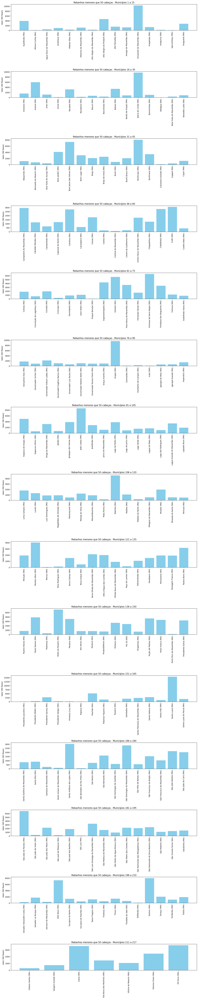

In [ ]:
# Configurar parâmetros gerais
df_total = sheets.parse("Total")
df_total = tratar_dados(df_total)
cidades_por_subplot = 15
total_cidades = len(df_total['Município'])
n_subplots = math.ceil(total_cidades / cidades_por_subplot)  # Número de subplots necessários

# 1. Gráfico para rebanhos menores que 50 cabeças
plt.figure(figsize=(15, 5 * n_subplots))  # Ajusta altura com base no número de subplots
for i in range(n_subplots):
    inicio = i * cidades_por_subplot
    fim = min(inicio + cidades_por_subplot, total_cidades)
    dados = df_total.iloc[inicio:fim]

    plt.subplot(n_subplots, 1, i + 1)  # Linhas x Colunas x Índice
    plt.bar(
        dados['Município'],
        dados['Valor da venda de cabeças de bovinos nos estabelecimentos agropecuários com 50 cabeças e menos (Mil Reais)'],
        color='skyblue'
    )
    plt.xticks(rotation=90)
    plt.ylabel("Valor (Mil Reais)")
    plt.title(f"Rebanhos menores que 50 cabeças - Municípios {inicio + 1} a {fim}")

plt.tight_layout()
plt.show()

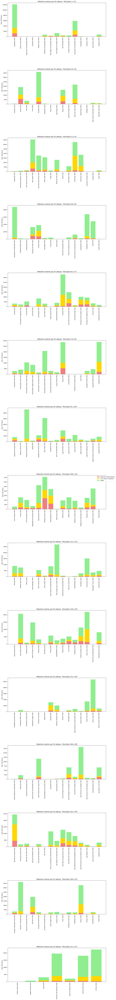

In [ ]:
# 2. Gráfico para rebanhos maiores que 50 cabeças (empilhado)
plt.figure(figsize=(15, 10 * n_subplots))  # Ajusta altura com base no número de subplots
for i in range(n_subplots):
    inicio = i * cidades_por_subplot
    fim = min(inicio + cidades_por_subplot, total_cidades)
    dados = df_total.iloc[inicio:fim]

    municipios = dados['Município']
    matrizes = dados['Valor da venda de cabeças de matrizes e reprodutores de bovinos nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)']
    cria_recria = dados['Valor da venda de cabeças de bovinos para cria, recria ou engorda nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)']
    abate = dados['Valor da venda de cabeças de bovinos para abate nos estabelecimentos agropecuários com mais de 50 cabeças (Mil Reais)']

    plt.subplot(n_subplots, 1, i + 1)
    plt.bar(municipios, matrizes, label='Matrizes e Reprodutores', color='lightcoral')
    plt.bar(municipios, cria_recria, bottom=matrizes, label='Cria, Recria e Engorda', color='gold')
    plt.bar(municipios, abate, bottom=matrizes + cria_recria, label='Abate', color='lightgreen')
    plt.xticks(rotation=90)
    plt.ylabel("Valor (Mil Reais)")
    plt.title(f"Rebanhos maiores que 50 cabeças - Municípios {inicio + 1} a {fim}")

plt.legend(loc='upper right', bbox_to_anchor=(1.1, n_subplots))
plt.tight_layout()
plt.subplots_adjust(hspace=1)


In [ ]:
def extractTipos(sheets, tipo):
  # Lista de tipologias
  tipologias = ['12', '35', '610', '1120', '2150', '51100', '101200', '201500', '5011000', '1001', '0']

  # Criar um DataFrame para armazenar os resultados
  resultados = []
  df_resultados = pd.DataFrame(resultados)

  # Iterar sobre as planilhas das tipologias
  for idx, tipologia in enumerate(tipologias):
      # Carregar as planilhas Total, NF e F
      df = sheets.parse(f"{tipologia} {tipo}").replace("X", -1)

      if idx == 0:
        df_resultados['Município'] = df['Município']

      # print(sum(df[f"Número de estabelecimentos agropecuários com bovinos (Unidades)"]))

      df_resultados[f"Tipologia {tipologia}"] = df[f"Número de estabelecimentos agropecuários com bovinos (Unidades)"]
      # Determinar a maior tipologia por município
  return df_resultados

In [ ]:
# Carregar o arquivo Excel
file_path = "base_de_dados.xlsx"
sheets = pd.ExcelFile(file_path)
df_tipos_total = extractTipos(sheets, "Total")
df_tipos_familiar = extractTipos(sheets, "F")

In [ ]:
df_tipos_total

,Município,Tipologia 12,Tipologia 35,Tipologia 610,Tipologia 1120,Tipologia 2150,Tipologia 51100,Tipologia 101200,Tipologia 201500,Tipologia 5011000,Tipologia 1001,Tipologia 0
0,Açailândia (MA),6,25,48,101,256,203,174,144,40,54,10
1,Afonso Cunha (MA),10,10,12,8,5,2,1,0,0,0,0
2,Água Doce do Maranhão (MA),54,65,65,31,10,0,0,0,0,0,5
3,Alcântara (MA),531,169,34,11,3,2,1,0,0,0,41
4,Aldeias Altas (MA),32,66,62,35,43,5,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
212,Viana (MA),58,118,176,160,97,14,14,6,0,1,14
213,Vila Nova dos Martírios (MA),2,2,10,31,96,77,44,56,11,13,4
214,Vitória do Mearim (MA),91,73,93,85,100,52,22,4,1,0,8
215,Vitorino Freire (MA),9,36,81,118,194,98,63,36,13,13,8


6642
9911
14498
17458
23225
9734
4839
2759
792
512
926


In [ ]:
result_tipos_soma_total = [6642*100/90370, 9911*100/90370, 14498*100/90370, 17458*100/90370, 23225*100/90370, 9734*100/90370, 4839*100/90370, 2759*100/90370, 792*100/90370, 512*100/90370]

[7.349784220427133,
 10.967135111209473,
 16.042934602190993,
 19.318357862122387,
 25.699900409427908,
 10.771273652760872,
 5.354653092840544,
 3.0530043155914575,
 0.8763970344140755,
 0.5665596990151599]

In [ ]:
result_tipos_soma_familiar = [5999*100/90370, 8851*100/90370, 12707*100/90370, 15148*100/90370, 19792*100/90370, 7567*100/90370, 2799*100/90370, 647*100/90370, 13*100/90370, 2*100/90370]


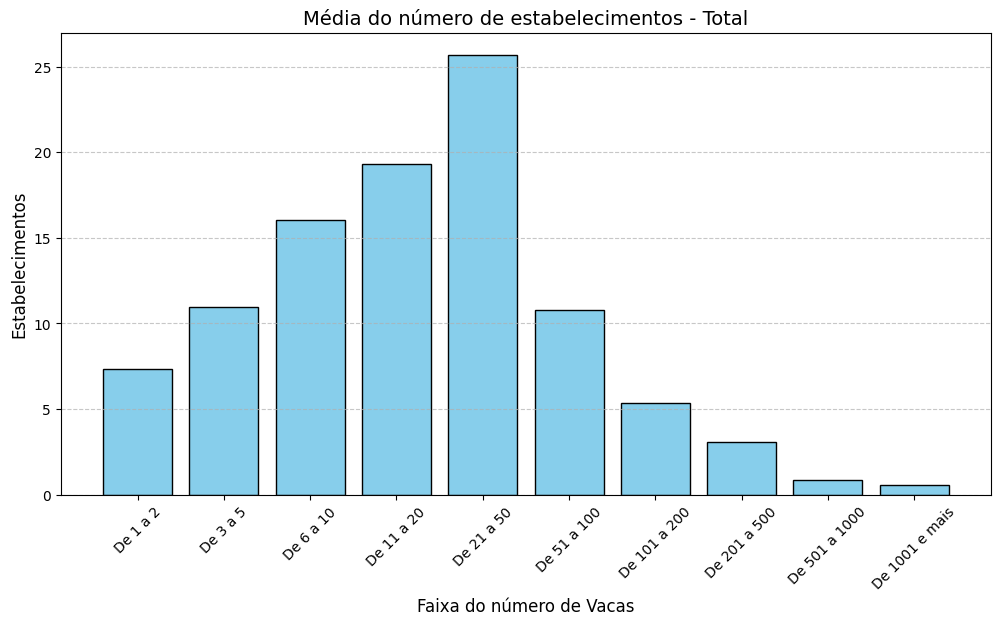

In [ ]:
intervalos = [
    "De 1 a 2", "De 3 a 5", "De 6 a 10", "De 11 a 20",
    "De 21 a 50", "De 51 a 100", "De 101 a 200",
    "De 201 a 500", "De 501 a 1000", "De 1001 e mais"
]
# Criar o histograma
plt.figure(figsize=(12, 6))
plt.bar(intervalos, result_tipos_soma_total, color='skyblue', edgecolor='black')
plt.title(f"Média do número de estabelecimentos - Total", fontsize=14)
plt.xlabel("Faixa do número de Vacas", fontsize=12)
plt.ylabel("Estabelecimentos", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(intervalos, rotation=45)
plt.show()

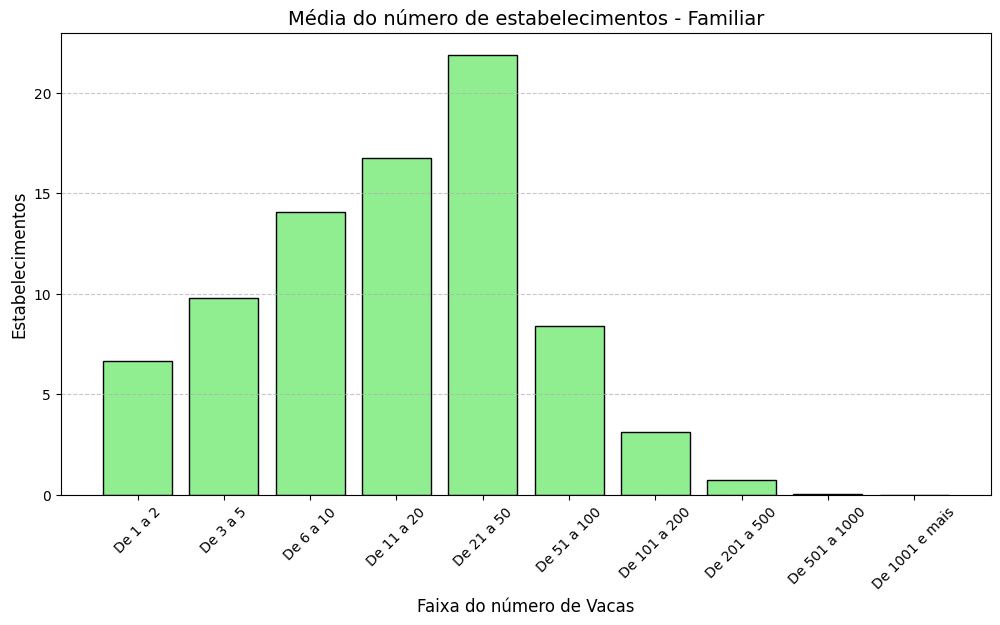

In [ ]:
# Criar o histograma
plt.figure(figsize=(12, 6))
plt.bar(intervalos, result_tipos_soma_familiar, color='lightgreen', edgecolor='black')
plt.title(f"Média do número de estabelecimentos - Familiar", fontsize=14)
plt.xlabel("Faixa do número de Vacas", fontsize=12)
plt.ylabel("Estabelecimentos", fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(intervalos, rotation=45)
plt.show()